In [1]:
from libtiff import TIFF
import numpy as np 
import matplotlib.pyplot as plt 
import plotly.express as px 


In [118]:
# https://drive.google.com/drive/folders/1vh8XlGmSVAEK3si_blbS4NK8kR4Iaj08?usp=sharing

file_path_2016 = '../data/Y2016.tif'
file_path_2021 = '../data/Y2021.tif'


In [128]:
import geopandas as gpd

shape = gpd.read_file('../data/Shapefile.geojson')
rectangle = gpd.read_file('../data/ShapefileR.geojson')

In [149]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def load_image(file_path):
    # Open the TIFF file
    with rasterio.open(file_path) as src:
        # Read the bands corresponding to Red, Green, and Blue components
      
        r = src.read(4)  # Assuming band 3 is Red
        g = src.read(3)  # Assuming band 2 is Green
        b = src.read(2)  # Assuming band 1 is Blue

        
        # Define a function to normalize each band
        def normalize_band(band):
            band_min, band_max = 0, 0.3
            return np.clip((band - band_min) / (band_max - band_min) * 255, 0, 255).astype(np.uint8)


        # Stack bands in the order expected by matplotlib (i.e., RGB)

        # Apply the normalization function to each band
        r_normalized = normalize_band(r)
        g_normalized = normalize_band(g)
        b_normalized = normalize_band(b)

        # Stack the normalized bands
        rgb_normalized = np.dstack((r_normalized, g_normalized, b_normalized))
        return rgb_normalized

rgb_2016 = load_image(file_path_2016)
rgb_2021 = load_image(file_path_2021)


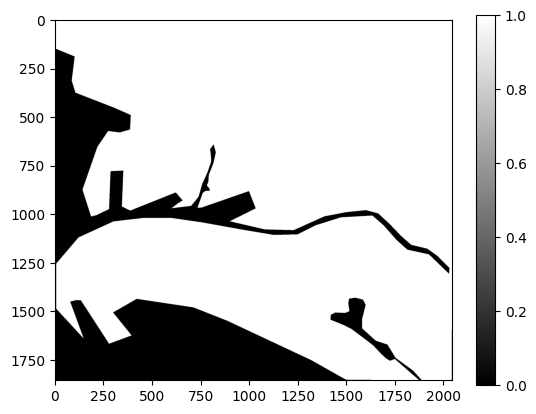

In [153]:
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
from shapely.geometry import box
import numpy as np

def create_mask_from_geojson(gdf, out_width, out_height):

    
    # Calculate bounds
    minx, miny, maxx, maxy = gdf.total_bounds
    
    # Calculate the resolution
    resx = (maxx - minx) / out_width
    resy = (maxy - miny) / out_height
    
    # Define the transformation from pixel coordinates to geographic coordinates
    transform = rasterio.transform.from_origin(minx, maxy, resx, resy)
    
    # Create the output image array
    out_image = np.zeros((out_height, out_width), dtype=rasterio.uint8)
    
    # Rasterize the geometries
    shapes = ((geom, 1) for geom in gdf.geometry)
    out_image = rasterize(shapes, out_shape=(out_height, out_width), fill=0, transform=transform, all_touched=True)

    return out_image


out_width, out_height = rgb_2016.shape[1], rgb_2016.shape[0]  # Desired output dimensions

# Create the mask
mask = create_mask_from_geojson(shape, out_width, out_height)

# Optionally, save or display the mask
import matplotlib.pyplot as plt
plt.imshow(mask, cmap='gray')
plt.colorbar()
plt.show()

<open DatasetReader name='../data/Y2016.tif' mode='r'>
<open DatasetReader name='../data/Y2021.tif' mode='r'>


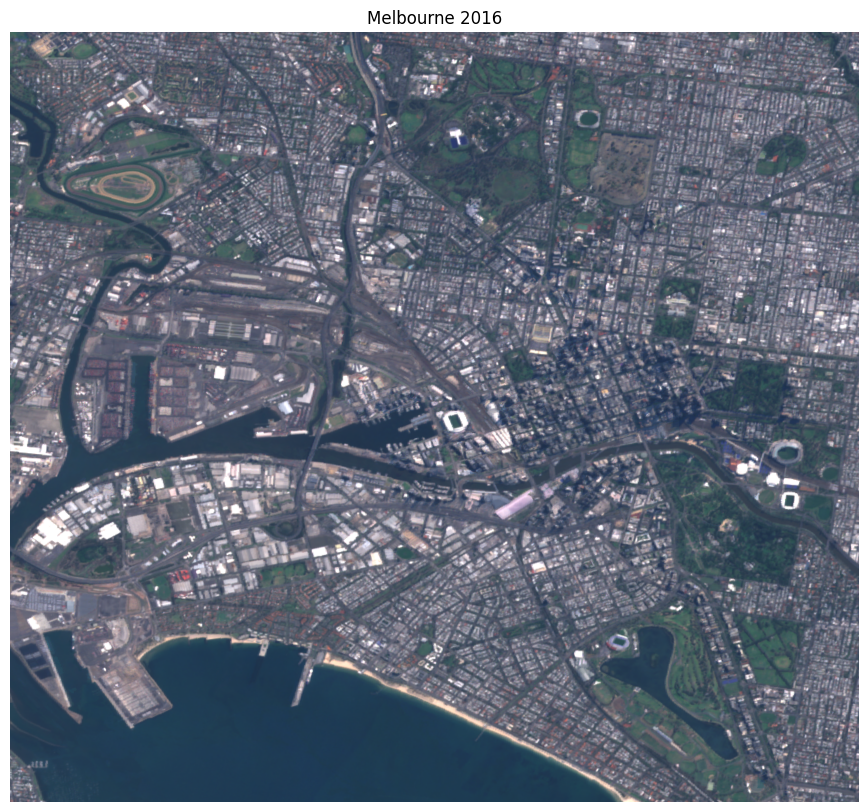

In [121]:

# Display the RGB image
plt.figure(figsize=(20, 10))
plt.imshow(rgb_2016)
plt.axis('off')  # Turn off axis numbers and ticks
plt.title('Melbourne 2016')
plt.show()

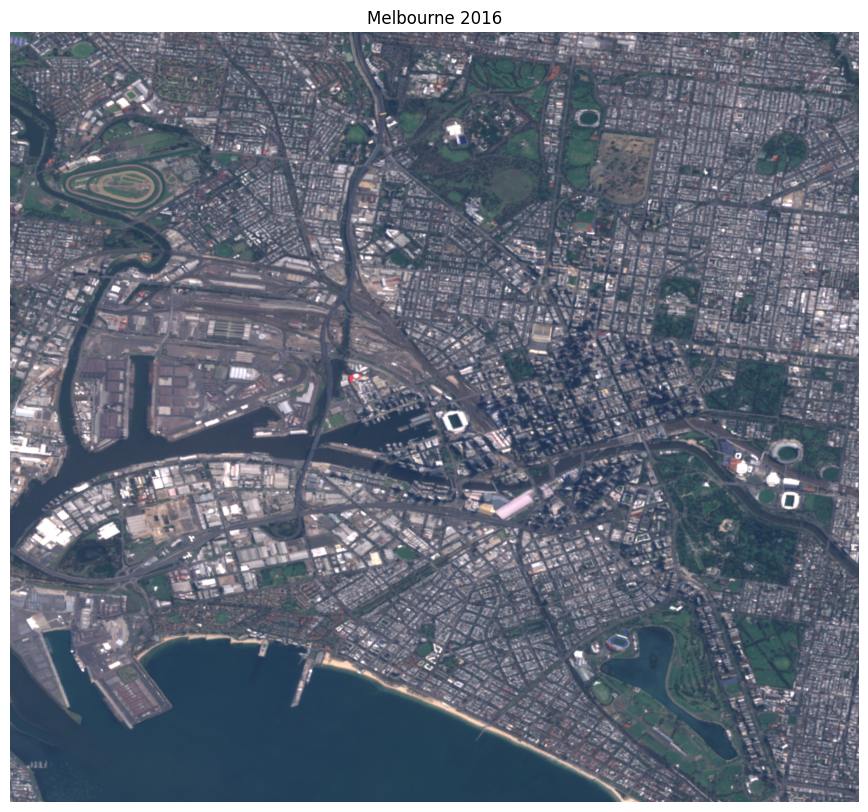

In [24]:
# Display the RGB image
plt.figure(figsize=(20, 10))
plt.imshow(rgb_2021)
plt.axis('off')  # Turn off axis numbers and ticks
plt.title('Melbourne 2016')
plt.show()

In [176]:

def add_area_trace(fig, channel_data, channel_name, color):
    hist_data, bin_edges = np.histogram(channel_data.flatten(), bins=256, range=(0, 255))
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    fig.add_trace(go.Scatter(x=bin_centers, y=hist_data, fill='tozeroy', name=channel_name, line=dict(color=color)))


def plot_intensity(rgb, mask=None):

    import plotly.graph_objects as go
    # Create a figure with subplots
    fig = go.Figure()

    # Add histograms to the figure

    # Add area chart traces
    if mask:
        print('applying mask')        
        add_area_trace(fig, rgb[:, :, 0][mask].flatten(), 'Red', 'red')
        add_area_trace(fig, rgb[:, :, 1][mask].flatten(), 'Green', 'green')
        add_area_trace(fig, rgb[:, :, 2][mask].flatten(), 'Blue', 'blue')

    else: 
        add_area_trace(fig, rgb[:, :, 0].flatten(), 'Red', 'red')
        add_area_trace(fig, rgb[:, :, 1].flatten(), 'Green', 'green')
        add_area_trace(fig, rgb[:, :, 2].flatten(), 'Blue', 'blue')

    # Update layout for clear visualization
    fig.update_layout(
        title_text='Color Histograms of RGB Image',
        xaxis_title_text='Pixel Intensity',
        yaxis_title_text='Count',
        bargap=0,  # Space between bars of adjacent location coordinates
        bargroupgap=0  # Gap between bars of the same location coordinate
    )

    # Show the plot
    fig.show()

In [177]:
plot_intensity(rgb_2016)

In [178]:
plot_intensity(rgb_2021)

In [253]:
land_mass = mask == 1


In [197]:
landmass_mask = mask == 1

In [198]:
r = rgb_2016[:, :, 0].flatten()

In [233]:
green_mask_2021 = (rgb_2021[:, :, 1] > 50) & (rgb_2021[:, :, 1] < 100) & (rgb_2021[:, :, 0] < 75)

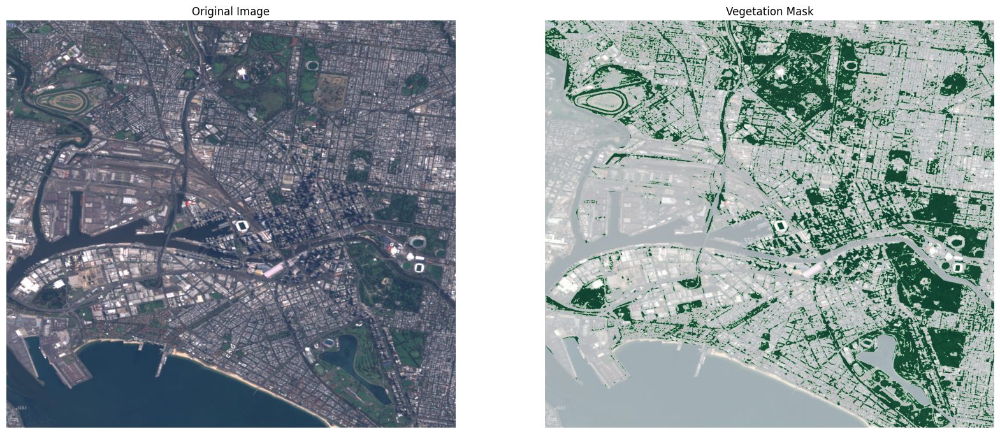

In [237]:

image = rgb_2021
# Define thresholds to identify vegetation
# Assuming vegetation is significantly greener than other components
# Display the original and the masked image
plt.figure(figsize=(20, 10))
plt.subplot(121)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
plt.title('Vegetation Mask')
plt.imshow(image)
plt.imshow((green_mask_2021 & landmass_mask) , alpha=0.6, cmap='Greens')
plt.axis('off')

plt.show()

In [255]:
green_mask_2016 = (rgb_2016[:, :, 1] > 50) & (rgb_2016[:, :, 1] < 100) & (rgb_2016[:, :, 0] < 75) & landmass_mask
green_mask_2021 = (rgb_2021[:, :, 1] > 50) & (rgb_2021[:, :, 1] < 100) & (rgb_2021[:, :, 0] < 75) & landmass_mask


In [264]:
part_of_green_2016 = green_mask_2016.sum() / (rgb_2016.shape[0] * rgb_2016.shape[1]) 
part_of_green_2021 = green_mask_2021.sum() / (rgb_2016.shape[0] * rgb_2016.shape[1])

In [266]:
part_of_green_2016 , part_of_green_2021

(0.21041982055163755, 0.21733929032972713)

In [267]:
part_of_green_2021 / part_of_green_2016

1.032884115954236

In [260]:
fig = go.Figure()

    # Add histograms to the figure

# Add area chart traces
add_area_trace(fig, rgb_2016[:, :, 1].flatten(), 'Green in 2016', 'red')
add_area_trace(fig, rgb_2021[:, :, 1].flatten(), 'Green in 2021', 'blue')
fig.show()

In [261]:
# water is more green in 2021 

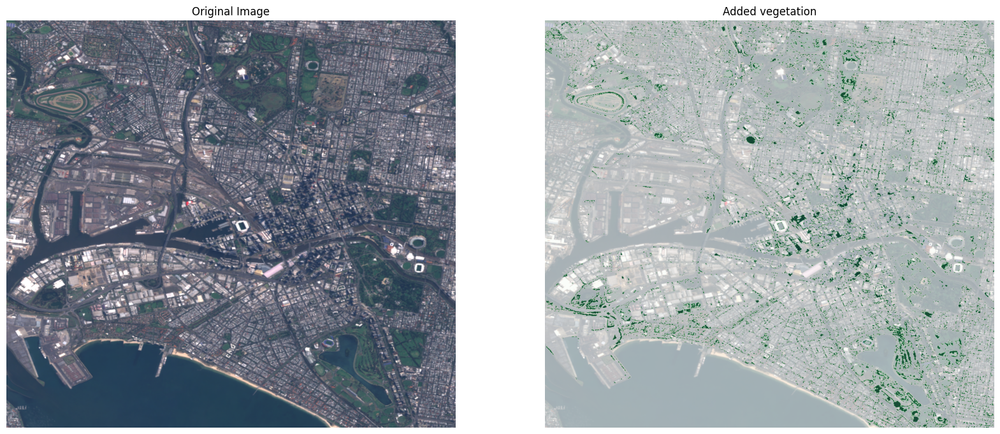

In [243]:

image = rgb_2021
# Define thresholds to identify vegetation
# Assuming vegetation is significantly greener than other components
# Display the original and the masked image
plt.figure(figsize=(20, 10))
plt.subplot(121)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
plt.title('Added vegetation')
plt.imshow(image)
plt.imshow((green_mask_2021 & ~green_mask_2016) , alpha=0.6, cmap='Greens')
plt.axis('off')

plt.show()

In [ ]:
image = rgb_2021
# Define thresholds to identify vegetation
# Assuming vegetation is significantly greener than other components
# Display the original and the masked image
plt.figure(figsize=(20, 10))
plt.subplot(121)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
plt.title('Vegetation Mask')
plt.imshow(rgb_2021)
plt.imshow(get_vegetation_mask(image), alpha=0.5, cmap='Greens')
plt.axis('off')

plt.show()

In [244]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("../data/trees-with-species-and-dimensions-urban-forest.csv") # 19 MB
df['date'] = pd.to_datetime(df['Date Planted'])

df2003 = df[df['Year Planted'] >= 2003].copy()
df_time = df2003.groupby(pd.Grouper(key='date', freq='M')).Latitude.count()

df2003['year-month']  = df2003.date.dt.year.astype(str) + '-' + df2003.date.dt.month.astype(str).str.zfill(2)

df2003 = df2003.sort_values('year-month')

df_time = df_time.to_frame().reset_index()
df_time.columns = ['date', 'count']


In [252]:
df2016 = df2003[df2003['Year Planted'] > 2016]

map_trace = px.scatter_mapbox(df2003,
                        lat="Latitude",
                        lon="Longitude", 
                        zoom=11,
                        height=600,
                        width=800
                       )


map_trace.update_layout(mapbox_style="open-street-map")
map_trace.show()

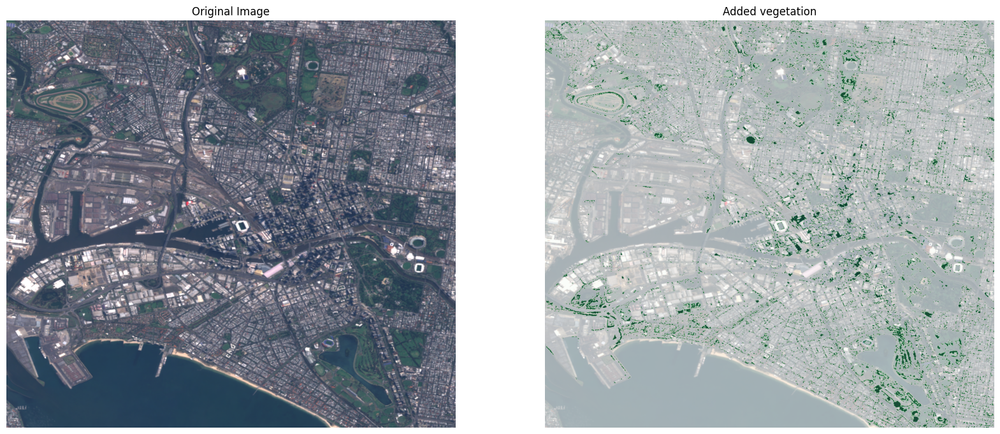